##Atividades - Filtragem Espacial
#####João Victor Do Nascimento Secate



####Imagens: [biel](https://ead.bri.ifsp.edu.br/moodle/mod/resource/view.php?id=72368), [lena](https://ead.bri.ifsp.edu.br/moodle/mod/resource/view.php?id=72337), [cameraman](https://ead.bri.ifsp.edu.br/moodle/mod/resource/view.php?id=72339).







##Obter imagens (Colab)

In [ ]:
!mkdir images
!wget -q -N -P images https://raw.githubusercontent.com/JvSecate/PDI//main/images/biel.png
!wget -q -N -P images https://raw.githubusercontent.com/JvSecate/PDI//main/images/lena_gray_512.tif
!wget -q -N -P images https://raw.githubusercontent.com/JvSecate/PDI//main/images/cameraman.tif

---


####Funções:

In [2]:
import numpy as np
import cv2
from numpy import asarray
from PIL import Image
from scipy import ndimage
import matplotlib.pyplot as plt

def plot(img, imgNew, titulo):
  # Plot usando matplotlib
  fig, ax = plt.subplots(nrows=1, ncols=2)
  ax[0].imshow(img, cmap='gray')
  ax[0].set_title("Imagem original")
  ax[1].imshow(imgNew, cmap='gray')
  ax[1].set_title(titulo)
  plt.show()

In [3]:
#Abrir imagens
images = [Image.open('images/biel.png'),
          Image.open('images/lena_gray_512.tif'),
          Image.open('images/cameraman.tif')]

####Implementar a operação de convolução utilizando OpenCV, scipy função convolve e implementação manual.

#####Usando OpenCV

In [4]:
def convoluOpenCV(img, kernel):
    image_np = np.array(img).astype('uint8')
    im1 = cv2.filter2D(image_np, -1, kernel, borderType=cv2.BORDER_REFLECT)
    # Susbstitui: Valores negativos = 0
    im1 = np.where(im1 < 0, 0, im1)
    # Converte para imagem
    image_out = Image.fromarray(im1.astype('uint8'))

    return image_out

#####Usando Scipy

In [5]:
def convoluScipy(img, kernel):
  image_np = np.array(img).astype(int)

  im1 = ndimage.convolve(image_np, kernel, mode='reflect')
  # Susbstitui: Valores negativos = 0
  im1 = np.where(im1<0, 0, im1)
  # Converte para imagem
  image_out = Image.fromarray(im1.astype('uint8'))
  return image_out

#####Implementação manual

In [6]:
def convoluManual(img, kernel):
    image_np = np.array(img).astype(int)
    img_height, img_width = image_np.shape
    kernel_size = kernel.shape[0]
    pad_size = kernel_size // 2
    padded_image = np.pad(image_np, pad_size, mode='reflect')
    output_image = np.zeros_like(image_np, dtype=int)

    # Convolução Manual
    for i in range(img_height):
        for j in range(img_width):
            roi = padded_image[i:i + kernel_size, j:j + kernel_size]
            conv_value = np.sum(roi * kernel)
            output_image[i, j] = max(0, conv_value)

    # Converte para imagem
    image_out = Image.fromarray(output_image.astype('uint8'))

    return image_out

#####Soma de imagens

In [7]:
def somaImg(img1, img2):
    image_np1 = np.array(img1).astype('uint8')
    image_np2 = np.array(img2).astype('uint8')
    image_npSoma = image_np1 + image_np2
    # Susbstitui: Valores negativos = 0
    image_npSoma = np.where(image_npSoma < 0, 0, image_npSoma)
    # Replace values superior than 255 with 255
    image_npSoma = np.where(image_npSoma > 255, 255, image_npSoma)
    # Convert to image
    image_out = Image.fromarray(image_npSoma.astype('uint8'))

    return image_out

####Implementar seguintes máscaras:





*   Média

In [8]:
# média
mean = np.array((
    [0.1111, 0.1111, 0.1111],
    [0.1111, 0.1111, 0.1111],
    [0.1111, 0.1111, 0.1111]), dtype="float")

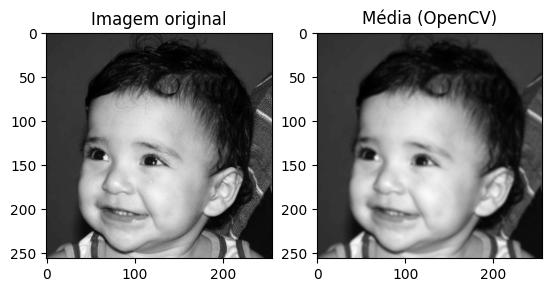

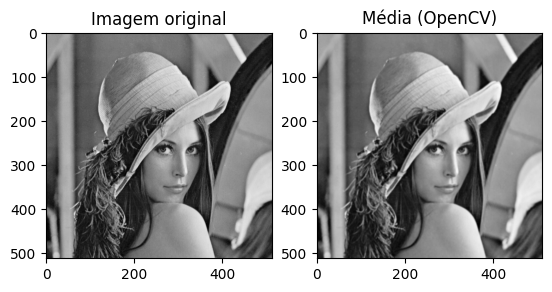

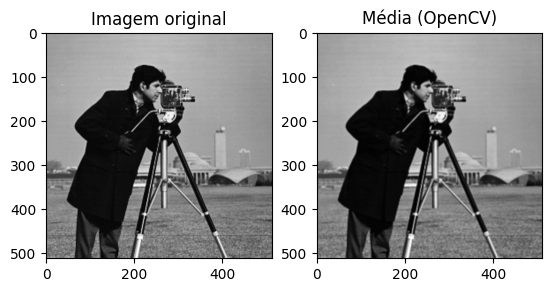

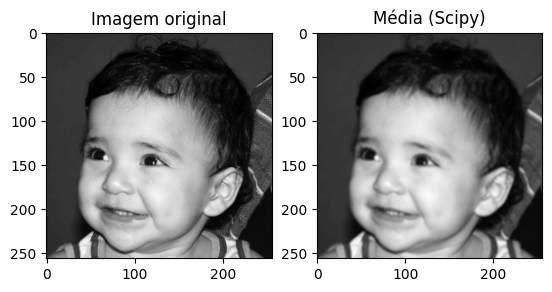

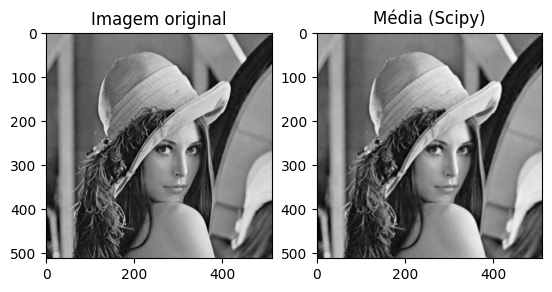

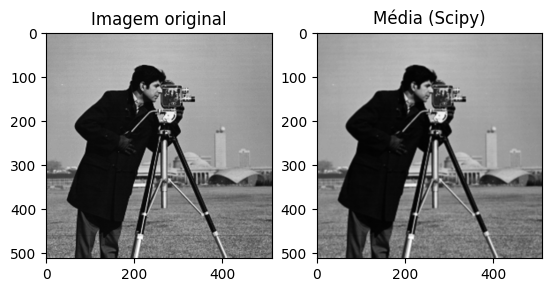

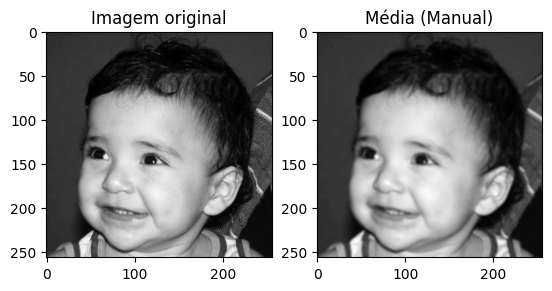

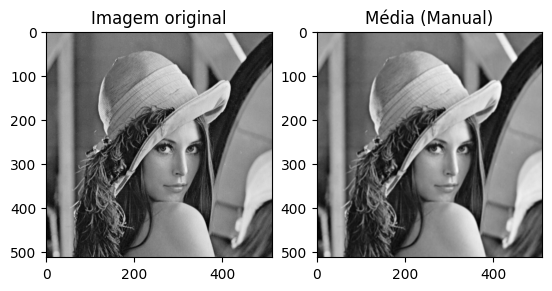

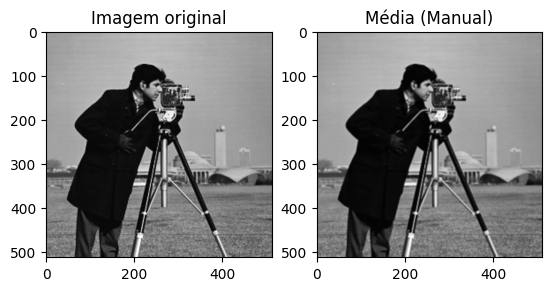

In [9]:
for img in images:
  imgNew = convoluOpenCV(img, mean)
  plot(img,imgNew,"Média (OpenCV)")

for img in images:
  imgNew = convoluScipy(img, mean)
  plot(img,imgNew,"Média (Scipy)")

for img in images:
  imgNew = convoluManual(img, mean)
  plot(img,imgNew,"Média (Manual)")



*   Gaussiano



In [10]:
# gaussiano
gauss = np.array((
    [0.0625, 0.125, 0.0625],
    [0.1250, 0.250, 0.1250],
    [0.0625, 0.125, 0.0625]), dtype="float")

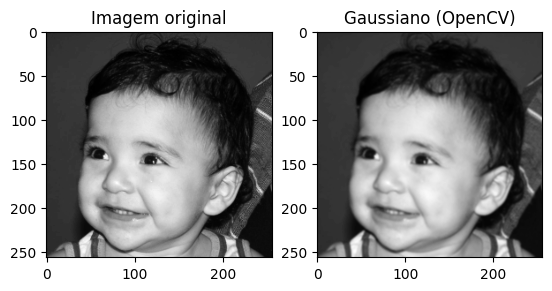

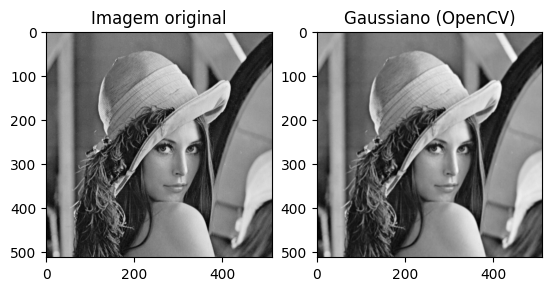

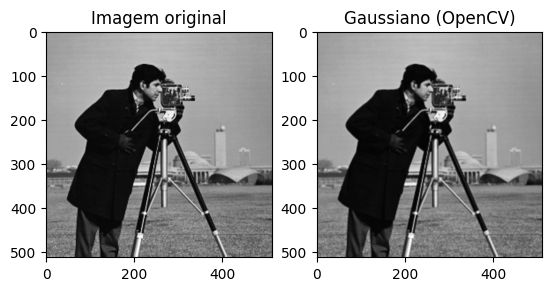

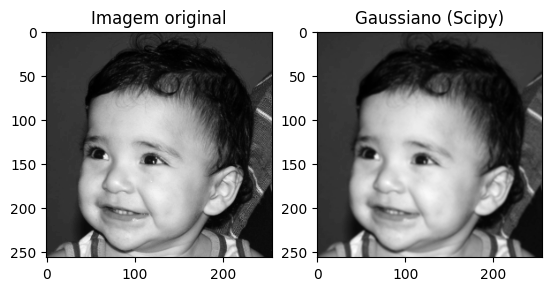

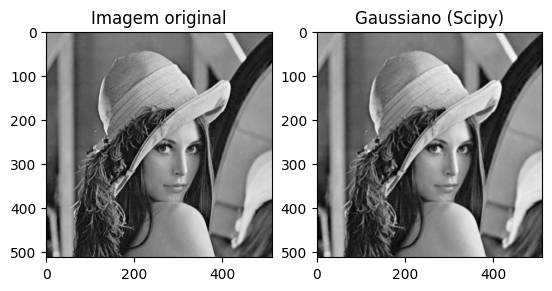

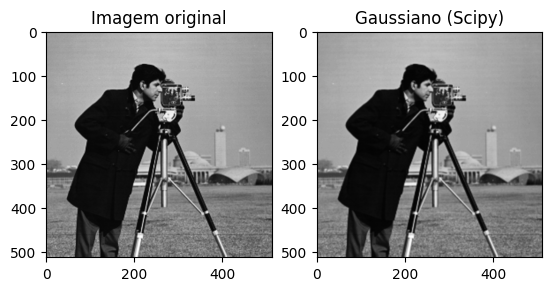

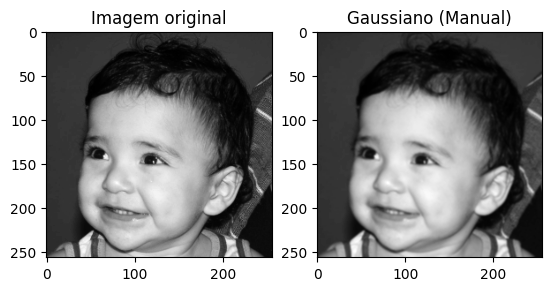

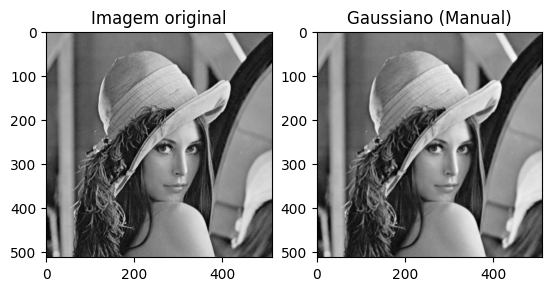

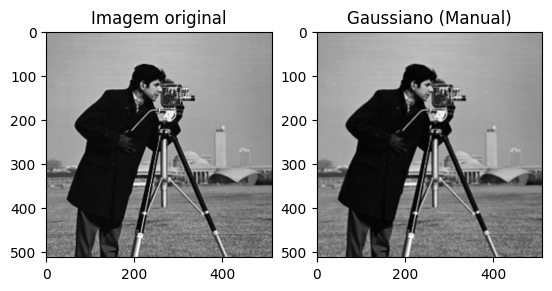

In [11]:
for img in images:
  imgNew = convoluOpenCV(img, gauss)
  plot(img,imgNew,"Gaussiano (OpenCV)")

for img in images:
  imgNew = convoluScipy(img, gauss)
  plot(img,imgNew,"Gaussiano (Scipy)")

for img in images:
  imgNew = convoluManual(img, gauss)
  plot(img,imgNew,"Gaussiano (Manual)")



*   Laplaciano



In [12]:
#laplaciano
lapl = np.array((
    [0,  1, 0],
    [1, -4, 1],
    [0,  1, 0]), dtype="int")

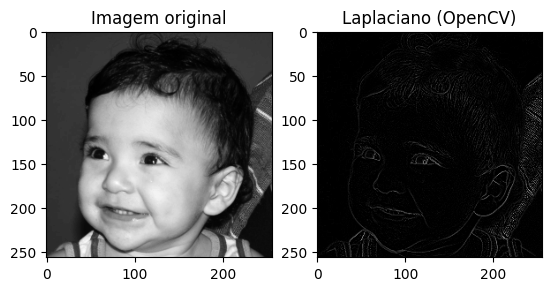

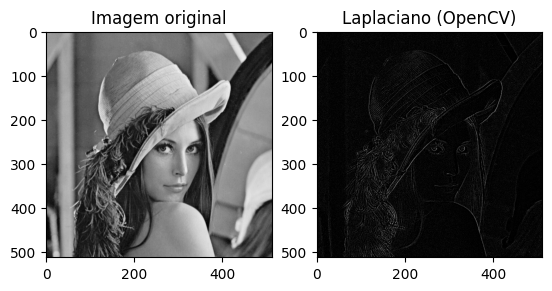

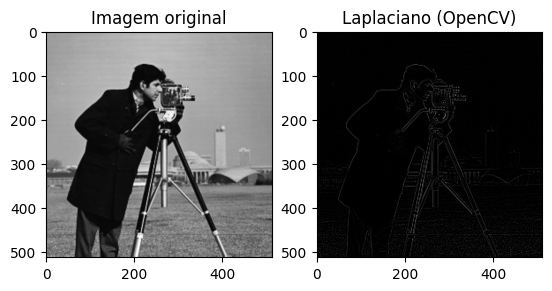

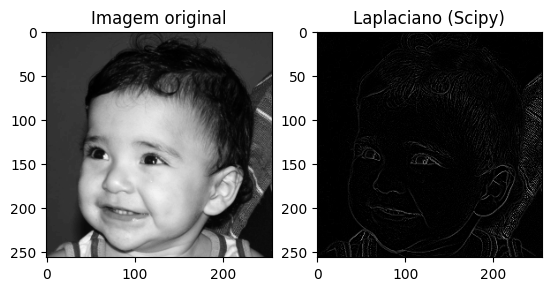

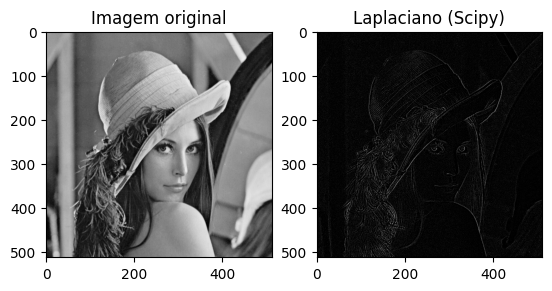

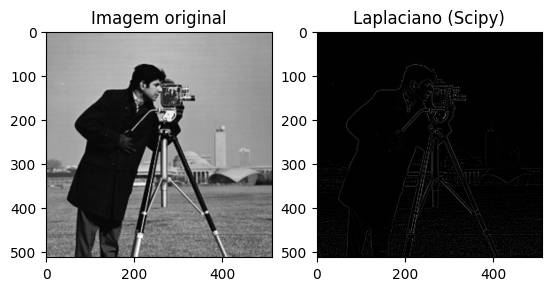

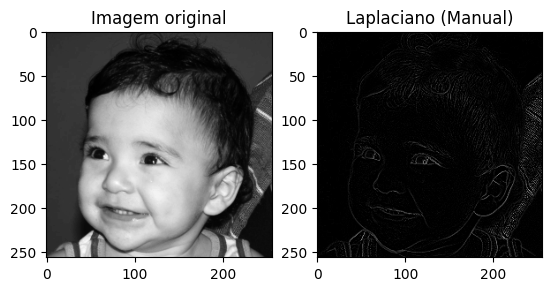

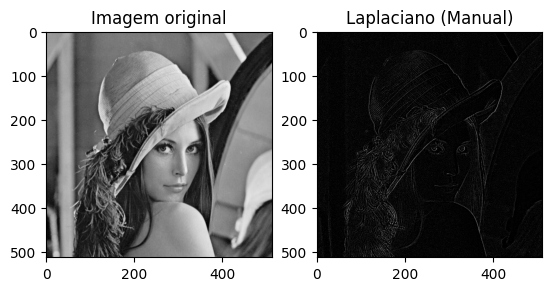

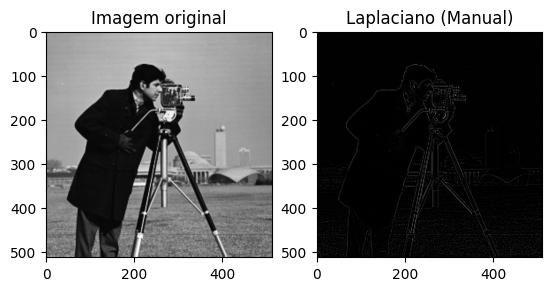

In [13]:
for img in images:
  imgNew = convoluOpenCV(img, lapl)
  plot(img,imgNew,"Laplaciano (OpenCV)")

for img in images:
  imgNew = convoluScipy(img, lapl)
  plot(img,imgNew,"Laplaciano (Scipy)")

for img in images:
  imgNew = convoluManual(img, lapl)
  plot(img,imgNew,"Laplaciano (Manual)")



*   Sobel X



In [14]:
#Sobel X
sobelX = np.array((
    [-1, 0, 1],
    [-2, 0, 2],
    [-1, 0, 1]), dtype="int")

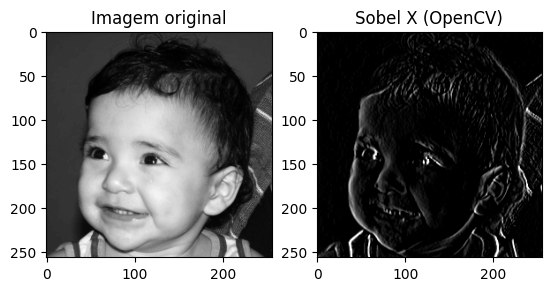

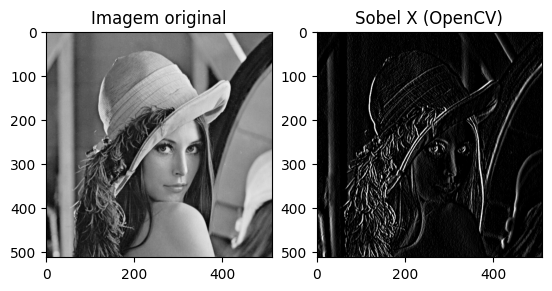

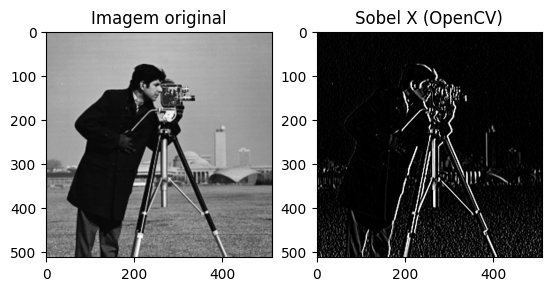

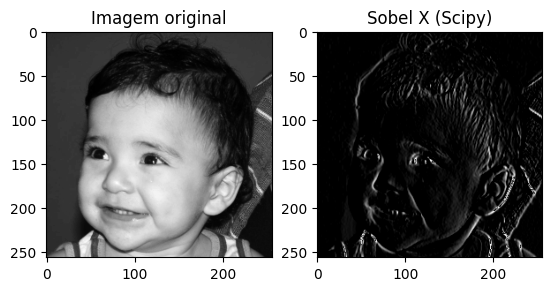

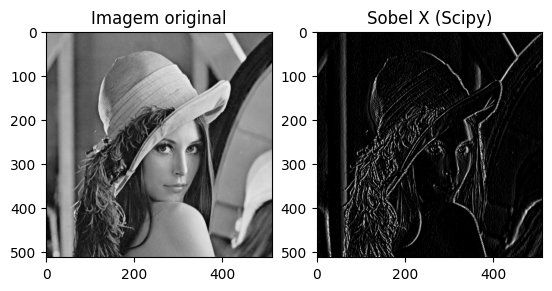

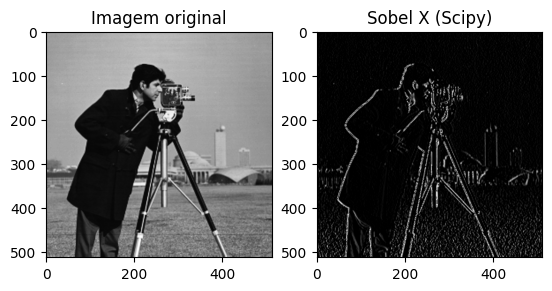

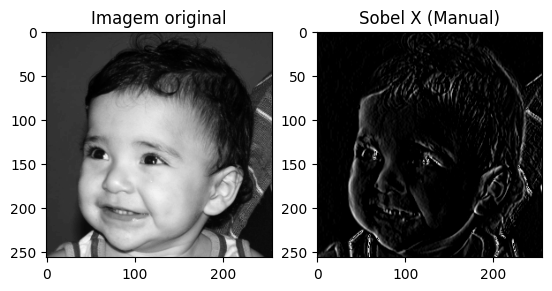

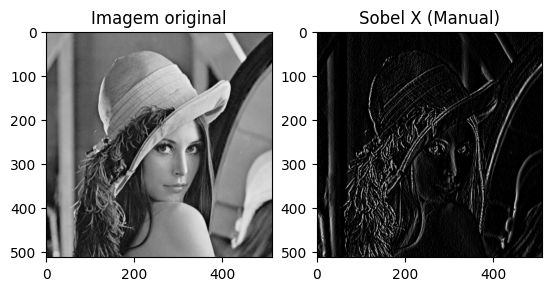

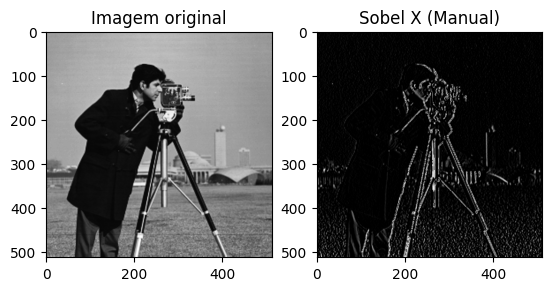

In [15]:
for img in images:
  imgNew = convoluOpenCV(img, sobelX)
  plot(img,imgNew,"Sobel X (OpenCV)")

for img in images:
  imgNew = convoluScipy(img, sobelX)
  plot(img,imgNew,"Sobel X (Scipy)")

for img in images:
  imgNew = convoluManual(img, sobelX)
  plot(img,imgNew,"Sobel X (Manual)")



*   Sobel Y



In [16]:
#Sobel Y
sobelY = np.array((
    [-1, -2, -1],
    [ 0,  0,  0],
    [ 1,  2,  1]), dtype="int")

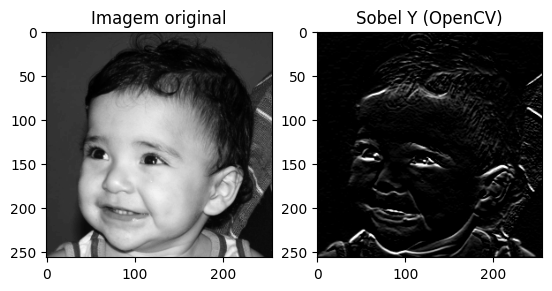

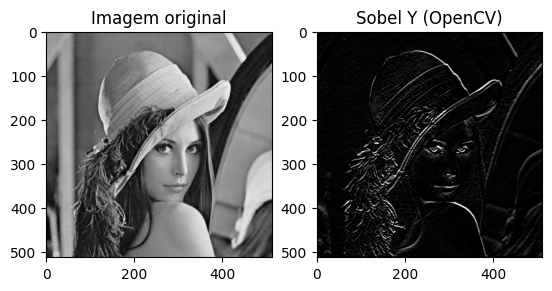

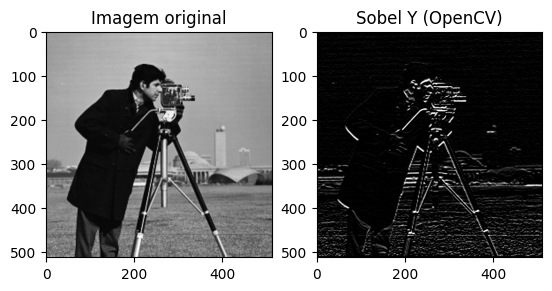

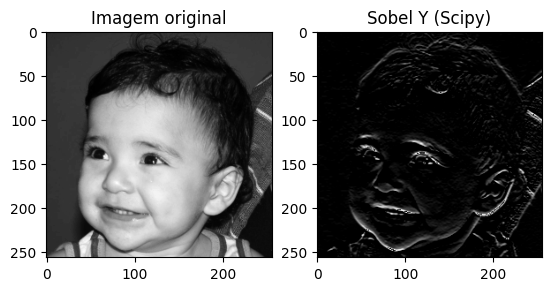

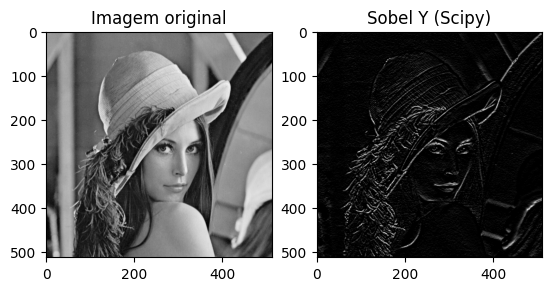

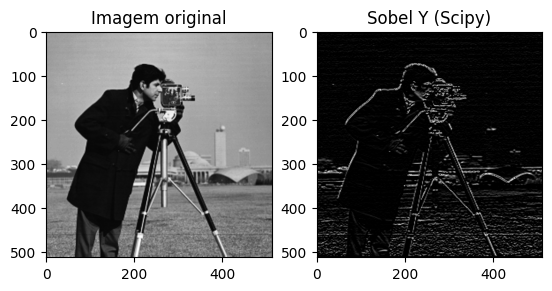

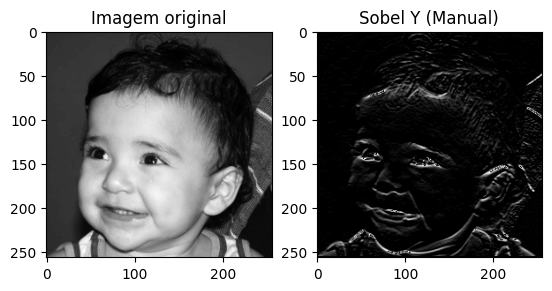

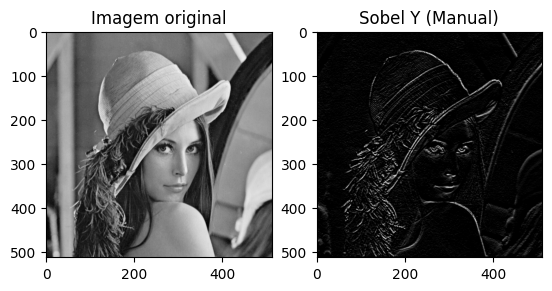

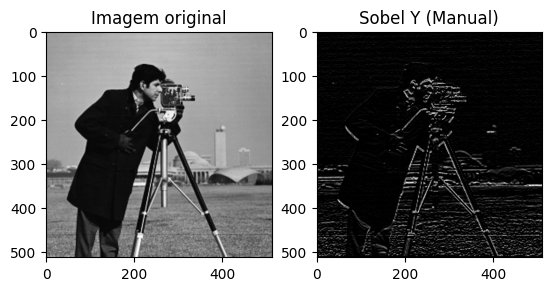

In [17]:
for img in images:
  imgNew = convoluOpenCV(img, sobelY)
  plot(img,imgNew,"Sobel Y (OpenCV)")

for img in images:
  imgNew = convoluScipy(img, sobelY)
  plot(img,imgNew,"Sobel Y (Scipy)")

for img in images:
  imgNew = convoluManual(img, sobelY)
  plot(img,imgNew,"Sobel Y (Manual)")

* Gradiente (Sobel X + Sobel Y)



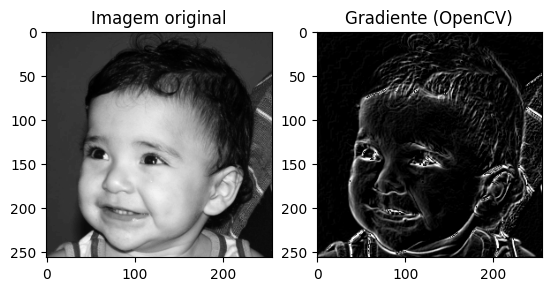

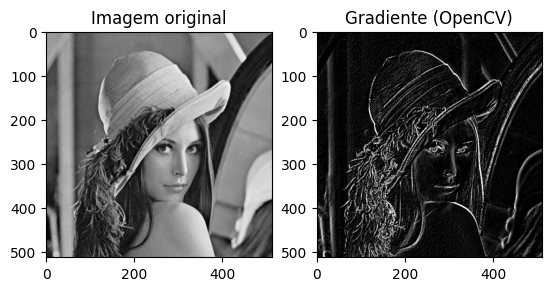

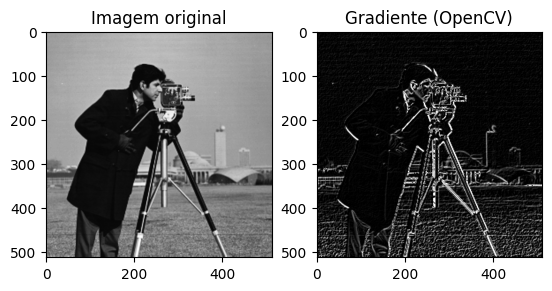

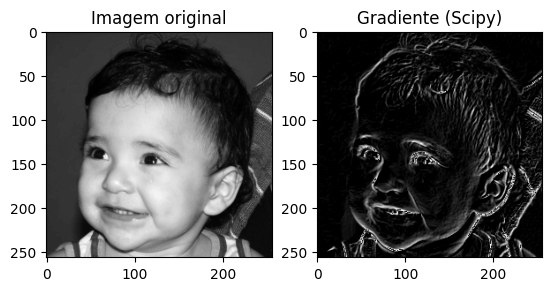

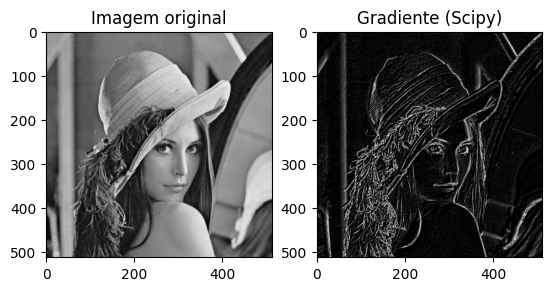

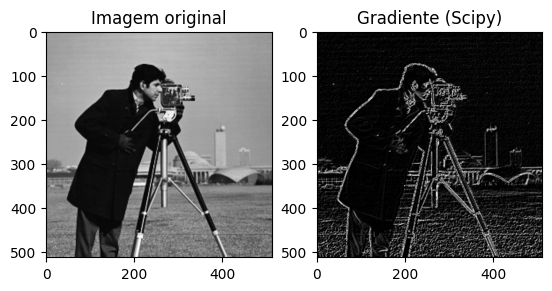

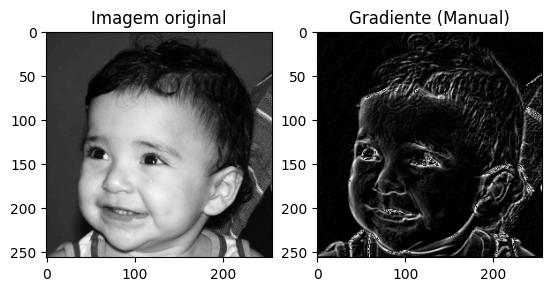

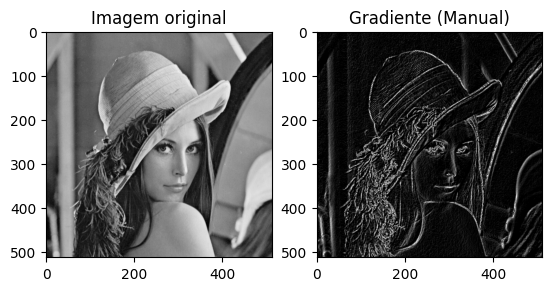

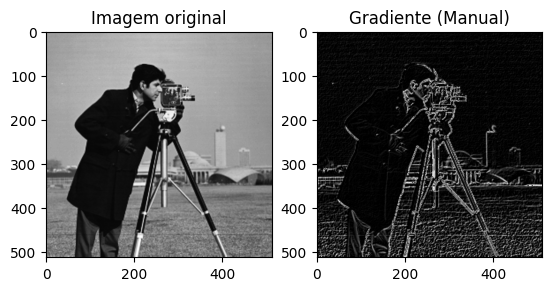

In [18]:
for img in images:
  imgNew = somaImg(convoluOpenCV(img, sobelX),
                   convoluOpenCV(img, sobelY))
  plot(img,imgNew,"Gradiente (OpenCV)")

for img in images:
  imgNew = somaImg(convoluScipy(img, sobelX),
                   convoluScipy(img, sobelY))
  plot(img,imgNew,"Gradiente (Scipy)")

for img in images:
  imgNew = somaImg(convoluManual(img, sobelX),
                   convoluManual(img, sobelY))
  plot(img,imgNew,"Gradiente (Manual)")

* Laplaciano somado a imagem original

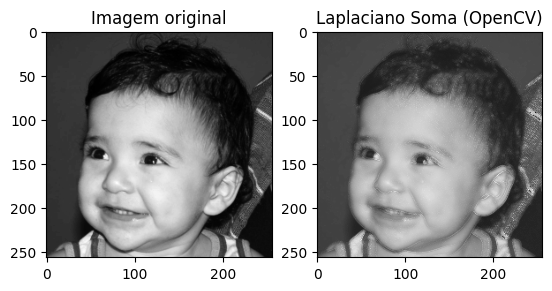

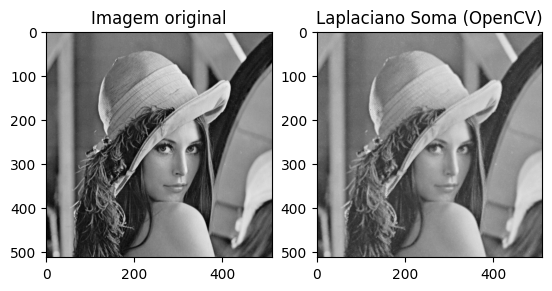

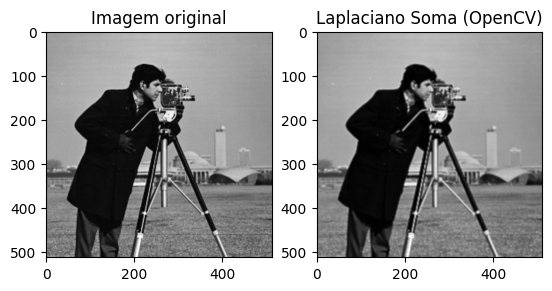

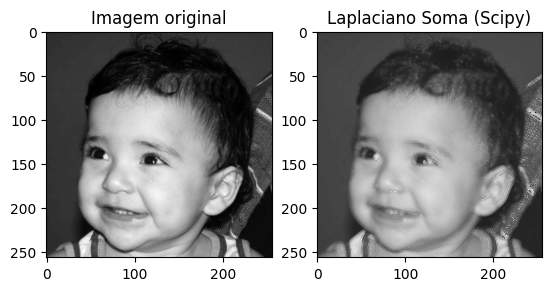

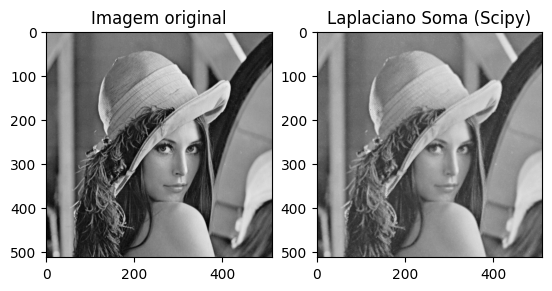

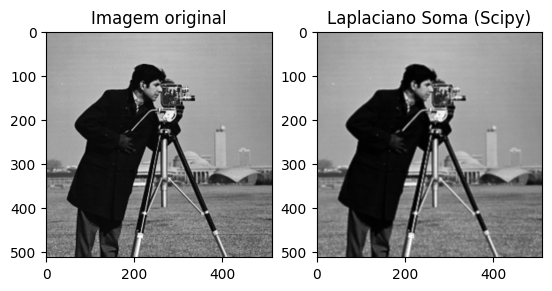

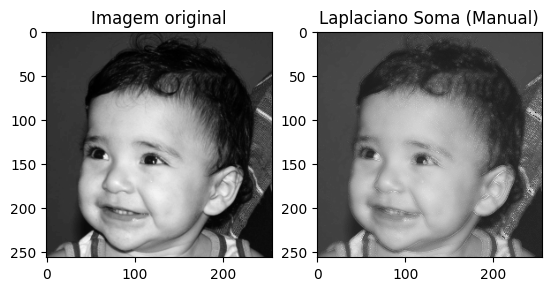

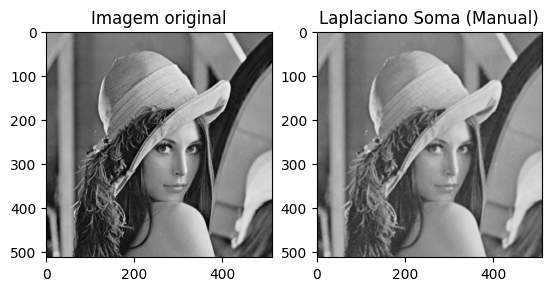

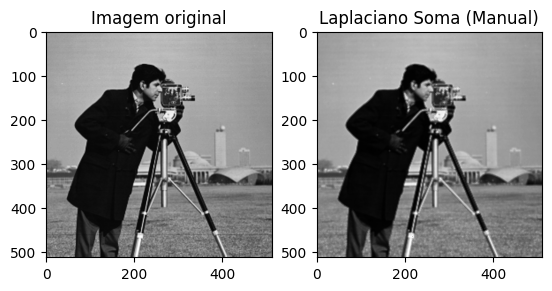

In [19]:
for img in images:
  imgNew = somaImg(img,
                   convoluOpenCV(img, lapl))
  plot(img,imgNew,"Laplaciano Soma (OpenCV)")

for img in images:
  imgNew = somaImg(img,
                   convoluScipy(img, lapl))
  plot(img,imgNew,"Laplaciano Soma (Scipy)")

for img in images:
  imgNew = somaImg(img,
                   convoluManual(img, lapl))
  plot(img,imgNew,"Laplaciano Soma (Manual)")